In [1]:
# =============== Hücre 0: Sessiz Mod (gürültüyü kıs, ERROR kalsın) ===============
import os, warnings, logging, contextlib, sys

# 1) C++ tarafı loglarını azalt (import'tan ÖNCE set et)
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"        # 0=hepsi, 1=INFO kapat, 2=INFO+WARNING kapat, 3=INFO+WARN+ERROR kapat
os.environ["TF_ENABLE_ONEDNN_OPTS"] = "0"       # bazı oneDNN bilgilendirmelerini susturur
os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = "true"

warnings.filterwarnings("ignore")

# 2) TF import'u sırasında stdout/stderr'i geçici olarak yut
try:
    with open(os.devnull, "w") as devnull, \
         contextlib.redirect_stdout(devnull), \
         contextlib.redirect_stderr(devnull):
        import tensorflow as tf
except Exception:
    tf = None

# 3) Python logger seviyeleri
try:
    if tf is not None:
        tf.get_logger().setLevel("ERROR")
    logging.getLogger("tensorflow").setLevel(logging.ERROR)
    try:
        import absl.logging as absl_logging
        absl_logging.set_verbosity(absl_logging.ERROR)
    except Exception:
        pass
except Exception:
    pass

print("Sessiz Mod aktif: INFO/WARNING gizlendi, ERROR görünecek. GPU allow_growth açık.")


2025-09-26 13:50:02.146017: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758894602.386758      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758894602.456664      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Sessiz Mod aktif: INFO/WARNING gizlendi, ERROR görünecek. GPU allow_growth açık.


## 0. TensorFlow Sessiz Mod & GPU Bellek Ayarı  

- **Amaç:** Eğitim sürecinde gereksiz log/gürültüyü azaltmak ve GPU belleğini daha verimli kullanmak.  

- **Yapılanlar:**  
  - TensorFlow ve Python uyarı/log seviyeleri **ERROR** düzeyine çekildi.  
  - INFO ve WARNING mesajları gizlenerek eğitim sırasında konsol çıktısı sadeleştirildi.  
  - `TF_ENABLE_ONEDNN_OPTS` ve `TF_FORCE_GPU_ALLOW_GROWTH` ayarları etkinleştirildi (tek seferde tüm VRAM’i rezerve etmez).  

- **Beklenen Çıktı:**  
Sessiz Mod aktif: INFO/WARNING gizlendi, ERROR görünecek. GPU allow_growth açık. mesajı konsola basılır.


In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/hard-hat-detection/annotations/hard_hat_workers1531.xml
/kaggle/input/hard-hat-detection/annotations/hard_hat_workers4092.xml
/kaggle/input/hard-hat-detection/annotations/hard_hat_workers2006.xml
/kaggle/input/hard-hat-detection/annotations/hard_hat_workers3414.xml
/kaggle/input/hard-hat-detection/annotations/hard_hat_workers4190.xml
/kaggle/input/hard-hat-detection/annotations/hard_hat_workers324.xml
/kaggle/input/hard-hat-detection/annotations/hard_hat_workers4181.xml
/kaggle/input/hard-hat-detection/annotations/hard_hat_workers3912.xml
/kaggle/input/hard-hat-detection/annotations/hard_hat_workers3704.xml
/kaggle/input/hard-hat-detection/annotations/hard_hat_workers4740.xml
/kaggle/input/hard-hat-detection/annotations/hard_hat_workers714.xml
/kaggle/input/hard-hat-detection/annotations/hard_hat_workers486.xml
/kaggle/input/hard-hat-detection/annotations/hard_hat_workers1331.xml
/kaggle/input/hard-hat-detection/annotations/hard_hat_workers3623.xml
/kaggle/input/hard-hat-

## 1. Ortam & Veri Kaynaklarının Doğrulanması  

- Kaggle ortamının temel kütüphaneleri (`numpy`, `pandas`) yüklendi.  
- `/kaggle/input` dizini taranarak veri dosyalarının varlığı ve yol yapısı konsola basıldı.  
- Kaggle çalışma dizinleri:  
  - **Girdi (salt okunur):** `/kaggle/input`  
  - **Çıktılar:** `/kaggle/working`  
  - **Geçici:** `/kaggle/temp`  

**Amaç:** Eğitim öncesi veri kaynağını ve klasör yapısını hızlıca doğrulamak.  

**Beklenen çıktı:** Tüm girdi dosyalarının tam yolları konsola basılır.  


In [3]:
# =============== Hücre 2: XML -> etiket + sınıf dağılımı + class_weight ===============
import os, glob, xml.etree.ElementTree as ET
import pandas as pd
import numpy as np

# 1) Veri yolu
DATA_DIR = "/kaggle/input/hard-hat-detection"
ANN_DIR  = os.path.join(DATA_DIR, "annotations")
IMG_DIR  = os.path.join(DATA_DIR, "images")

assert os.path.isdir(ANN_DIR), f"Annotations klasörü yok: {ANN_DIR}"
assert os.path.isdir(IMG_DIR), f"Images klasörü yok: {IMG_DIR}"

# 2) Yardımcılar
IMG_EXTS = (".png", ".jpg", ".jpeg", ".bmp", ".webp")

def find_image_for_xml(xml_path):
    """XML dosya adıyla aynı görseli images klasöründe bulur."""
    base = os.path.splitext(os.path.basename(xml_path))[0]
    for ext in IMG_EXTS:
        cand = os.path.join(IMG_DIR, base + ext)
        if os.path.isfile(cand):
            return cand
    return None

def image_label_from_xml(xml_path):
    """
    XML içindeki <object><name> alanlarını okuyup:
    en az bir 'helmet' varsa 'helmet', yoksa 'no_helmet' döndürür.
    """
    try:
        tree = ET.parse(xml_path)
        root = tree.getroot()
        names = [obj.findtext("name") for obj in root.findall("object")]
        names = [n.strip().lower() for n in names if n]
        return "helmet" if "helmet" in names else "no_helmet"
    except Exception:
        return "no_helmet"

# 3) XML'leri tara, (filepath, label) tablosu oluştur
xml_files = sorted(glob.glob(os.path.join(ANN_DIR, "*.xml")))
rows, missing_img = [], 0
for xp in xml_files:
    img_path = find_image_for_xml(xp)
    if img_path is None:
        missing_img += 1
        continue
    rows.append({"filepath": img_path, "label": image_label_from_xml(xp)})

df = pd.DataFrame(rows)
print(f"Toplam XML: {len(xml_files)} | Eşleşen görüntü: {len(df)} | Eşleşmeyen: {missing_img}")

# 4) Sınıf dağılımı
counts = df["label"].value_counts().to_dict()
df_counts = pd.DataFrame([counts]).reindex(columns=["helmet","no_helmet"]).fillna(0).astype(int)
print("\nSınıf dağılımı:")
print(df_counts.to_string(index=False))

# 5) class_weight hesapla: total/(n_classes * count)
def compute_class_weight_from_counts(counts_dict):
    total = sum(counts_dict.values())
    n_classes = 2
    w_helmet   = total / (n_classes * max(counts_dict.get("helmet", 0), 1))
    w_nohelmet = total / (n_classes * max(counts_dict.get("no_helmet", 0), 1))
    return {"helmet": w_helmet, "no_helmet": w_nohelmet}

class_weight = compute_class_weight_from_counts(counts)
print("\n[Önerilen class_weight] (fit'te kullanılacak):", {k: round(v, 4) for k, v in class_weight.items()})

# 6) Hızlı önizleme
print("\nÖrnek satırlar:")
print(df.head().to_string(index=False))


Toplam XML: 5000 | Eşleşen görüntü: 5000 | Eşleşmeyen: 0

Sınıf dağılımı:
 helmet  no_helmet
   4581        419

[Önerilen class_weight] (fit'te kullanılacak): {'helmet': 0.5457, 'no_helmet': 5.9666}

Örnek satırlar:
                                                        filepath  label
   /kaggle/input/hard-hat-detection/images/hard_hat_workers0.png helmet
   /kaggle/input/hard-hat-detection/images/hard_hat_workers1.png helmet
  /kaggle/input/hard-hat-detection/images/hard_hat_workers10.png helmet
 /kaggle/input/hard-hat-detection/images/hard_hat_workers100.png helmet
/kaggle/input/hard-hat-detection/images/hard_hat_workers1000.png helmet


## 2. XML’den Etiketleme & Sınıf Ağırlıkları  

- `annotations/*.xml` dosyaları işlenerek her görüntü **helmet / no_helmet** olarak etiketlendi.  
- Aynı ada sahip görseller `images/` klasöründe bulunarak otomatik eşleştirildi.  
- **Sınıf dağılımı** yazdırılarak veri dengesizliği kontrol edildi.  
- **Class weight** değerleri `total / (n_classes * count)` formülüyle hesaplanarak eğitimde kullanılmak üzere hazırlandı.  
- İlk birkaç satır örnek olarak gösterildi.  

**Amaç:** Veri setindeki her örneğin dosya yolu ve etiketiyle bir DataFrame oluşturmak, dengesizliği görmek ve eğitim sırasında azınlık sınıfa ağırlık verebilmek.  

**Beklenen Çıktı:**  
Toplam XML sayısı, eşleşen görüntü sayısı, sınıf dağılımı tablosu, önerilen class weight değerleri ve örnek satırlar.


In [4]:
# =============== Hücre 3: Stratified split + ImageDataGenerator + class_weight eşleme ===============
import gc
import pandas as pd
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Önceki hücreden beklenen: df (columns: filepath, label) ve class_weight (dict: helmet/no_helmet)
assert 'df' in globals() and len(df) > 0, "df bulunamadı; lütfen Hücre 2'yi çalıştırın."
assert 'class_weight' in globals() and isinstance(class_weight, dict), "class_weight yok; Hücre 2'yi çalıştırın."

# 1) Parametreler (RAM dostu)
SEED     = 42
IMG_SIZE = (224, 224)   # Mentor: resim boyutunu küçültmek RAM'i düşürür
BATCH    = 32           # VRAM sınırında 16'ya inebiliriz

# 2) Stratified train/valid ayrımı
train_df, val_df = train_test_split(
    df, test_size=0.2, stratify=df['label'], random_state=SEED
)
print("Train sınıf sayıları:", train_df['label'].value_counts().to_dict())
print("Valid sınıf sayıları:", val_df['label'].value_counts().to_dict())

# 3) ImageDataGenerator — augmentation (mentor: rotation, flip, zoom, brightness)
train_datagen = ImageDataGenerator(
    rescale=1./255.,
    rotation_range=15,
    width_shift_range=0.10,
    height_shift_range=0.10,
    zoom_range=0.15,
    brightness_range=(0.8, 1.2),
    horizontal_flip=True,
    fill_mode='nearest'
)
valid_datagen = ImageDataGenerator(rescale=1./255.)

# 4) Generator’lar (label -> categorical one-hot)
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='filepath',
    y_col='label',
    target_size=IMG_SIZE,
    class_mode='categorical',
    batch_size=BATCH,
    shuffle=True,
    seed=SEED,
    validate_filenames=True
)
valid_generator = valid_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col='filepath',
    y_col='label',
    target_size=IMG_SIZE,
    class_mode='categorical',
    batch_size=BATCH,
    shuffle=False,
    seed=SEED,
    validate_filenames=True
)

# 5) class_weight'i indekslere eşle (fit'te kullanılacak form: {class_index: weight})
indices = train_generator.class_indices  # örn {'helmet': 0, 'no_helmet': 1}
class_weight_fit = {
    indices['helmet']:    float(class_weight['helmet']),
    indices['no_helmet']: float(class_weight['no_helmet'])
}

print("\nclass_indices:", indices)
print("class_weight_fit:", {k: round(v, 4) for k, v in class_weight_fit.items()})
print(f"\nÖzet -> train_batches: {len(train_generator)}, valid_batches: {len(valid_generator)}, IMG_SIZE: {IMG_SIZE}, BATCH: {BATCH}")

gc.collect();


Train sınıf sayıları: {'helmet': 3665, 'no_helmet': 335}
Valid sınıf sayıları: {'helmet': 916, 'no_helmet': 84}
Found 4000 validated image filenames belonging to 2 classes.
Found 1000 validated image filenames belonging to 2 classes.

class_indices: {'helmet': 0, 'no_helmet': 1}
class_weight_fit: {0: 0.5457, 1: 5.9666}

Özet -> train_batches: 125, valid_batches: 32, IMG_SIZE: (224, 224), BATCH: 32


## 3. Train / Validation Ayrımı ve RAM-Dostu Veri Besleme

- **Stratified split:** Veri %80 train / %20 validation olarak, sınıf dağılımı korunacak şekilde ayrıldı.
- **Veri artırma (train):** `rescale=1./255.` + `rotation/shift/zoom/brightness/horizontal_flip` ile genelleme artırıldı.
- **Doğrulama akışı:** Validation tarafında sadece `rescale` uygulandı (tarafsız değerlendirme).
- **Akış (generator):** `flow_from_dataframe` ile dosyalar diskten batch halinde okunur; tüm veri RAM’e yüklenmez.
- **Sınıf ağırlıkları:** Hesaplanan `class_weight` değerleri, indeks tabanlı `class_weight_fit` formatına dönüştürüldü.

**Amaç:** Dengesiz veriyle adil eğitim için stratified ayrım + augmentasyon + class_weight; aynı zamanda bellek kullanımını kontrol altında tutan bir veri boru hattı kurmak.

**Beklenen Çıktılar:** Train/valid sınıf sayıları, `class_indices`, `class_weight_fit`, batch sayıları ve temel eğitim parametreleri.


In [5]:
# =============== Hücre 4: Basit CNN + L2 + Dropout ===============
import os, gc
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, regularizers
from datetime import datetime

# Önceki hücrelerden beklenenler:
# - train_generator, valid_generator
# - class_weight_fit (ör: {0: 0.5457, 1: 5.9666})
assert 'train_generator' in globals() and 'valid_generator' in globals(), "Generator'lar yok; Hücre 3'ü çalıştırın."
assert 'class_weight_fit' in globals() and isinstance(class_weight_fit, dict), "class_weight_fit yok; Hücre 3'ü bitirin."

IMG_SIZE = train_generator.target_size + (3,)

def build_simple_cnn(input_shape, n_classes=2, l2=1e-4, dropout=0.5):
    inputs = layers.Input(shape=input_shape)
    x = inputs
    # Blok 1
    x = layers.Conv2D(32, 3, padding="same", activation="relu",
                      kernel_regularizer=regularizers.l2(l2))(x)
    x = layers.MaxPool2D()(x)
    # Blok 2
    x = layers.Conv2D(64, 3, padding="same", activation="relu",
                      kernel_regularizer=regularizers.l2(l2))(x)
    x = layers.MaxPool2D()(x)
    # Blok 3
    x = layers.Conv2D(128, 3, padding="same", activation="relu",
                      kernel_regularizer=regularizers.l2(l2))(x)
    x = layers.MaxPool2D()(x)

    x = layers.Flatten()(x)
    x = layers.Dropout(dropout)(x)
    x = layers.Dense(128, activation="relu", kernel_regularizer=regularizers.l2(l2))(x)
    x = layers.Dropout(dropout)(x)
    # Mixed precision açıksa çıktı dtype'ını float32'de tut
    outputs = layers.Dense(2, activation="softmax", dtype="float32")(x)
    model = keras.Model(inputs, outputs)
    return model

model = build_simple_cnn(IMG_SIZE, n_classes=2, l2=1e-4, dropout=0.5)
optimizer = keras.optimizers.Adam(learning_rate=1e-3)

model.compile(
    optimizer=optimizer,
    loss="categorical_crossentropy",  # generator one-hot verdiği için categorical
    metrics=["accuracy"]              # P/R/F1 -> değerlendirme hücresinde sklearn ile hesaplanacak
)

# --- TensorBoard callback (Baseline) ---
timestamp = datetime.now().strftime("%Y%m%d-%H%M%S")
tb_log_dir_baseline = os.path.join("/kaggle/working/logs", f"baseline_{timestamp}")
tb_callback_baseline = keras.callbacks.TensorBoard(
    log_dir=tb_log_dir_baseline,
    histogram_freq=1, write_graph=False
)

callbacks = [
    keras.callbacks.EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True),
    keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2),
    keras.callbacks.ModelCheckpoint("/kaggle/working/baseline_best.keras",
                                    monitor="val_loss", save_best_only=True),
    tb_callback_baseline
]

history = model.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=15,
    class_weight=class_weight_fit,
    verbose=1,
    callbacks=callbacks
)

print("Eğitim tamamlandı. En iyi ağırlıklar yüklendi.")
print(f"[TensorBoard] Baseline log klasörü: {tb_log_dir_baseline}")
gc.collect();


I0000 00:00:1758894640.972924      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1758894640.973645      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Epoch 1/15


I0000 00:00:1758894647.624885      63 service.cc:148] XLA service 0x7a12d000c440 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1758894647.626058      63 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1758894647.626085      63 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1758894648.043730      63 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1758894654.345536      63 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


125/125 ━━━━━━━━━━━━━━━━━━━━ 123s 904ms/step - accuracy: 0.4716 - loss: 1.1894 - val_accuracy: 0.9160 - val_loss: 0.6971 - learning_rate: 0.0010
Epoch 2/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 90s 716ms/step - accuracy: 0.4596 - loss: 0.7261 - val_accuracy: 0.5010 - val_loss: 0.8015 - learning_rate: 0.0010
Epoch 3/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 90s 718ms/step - accuracy: 0.6786 - loss: 0.6406 - val_accuracy: 0.7960 - val_loss: 0.6609 - learning_rate: 0.0010
Epoch 4/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 89s 712ms/step - accuracy: 0.7579 - loss: 0.6383 - val_accuracy: 0.8180 - val_loss: 0.5730 - learning_rate: 0.0010
Epoch 5/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 88s 703ms/step - accuracy: 0.7503 - loss: 0.6099 - val_accuracy: 0.6460 - val_loss: 0.7749 - learning_rate: 0.0010
Epoch 6/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 88s 704ms/step - accuracy: 0.7163 - loss: 0.6098 - val_accuracy: 0.7930 - val_loss: 0.5869 - learning_rate: 0.0010
Epoch 7/15
125/125 ━━━━━━━━━━━━━━━━━━━━ 87s 699ms/step - accuracy: 0.7598 - loss

## 4. Baseline CNN (L2 + Dropout) ve Eğitim

- **Mimari:** 3×(Conv2D → MaxPool) + `Flatten` + `Dropout` + `Dense(128, L2)` + `Dropout` + `Dense(2, softmax)`
- **Düzenlileştirme:** `L2` ve `Dropout` ile aşırı uyum (overfitting) azaltıldı.
- **Derleme:** `Adam(lr=1e-3)`, `loss='categorical_crossentropy'`, `metrics=['accuracy']`
- **Callback’ler:**
  - `EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)`
  - `ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2)`
  - `ModelCheckpoint('/kaggle/working/baseline_best.keras', save_best_only=True)`
- **Eğitim:** `model.fit(..., class_weight=class_weight_fit, epochs=15)` — dengesiz veri için sınıf ağırlıkları uygulandı.

**Amaç:** Hızlı ve düzenlileştirilmiş bir **baseline** kurup, sonraki Transfer Learning adımıyla karşılaştırma için referans performans elde etmek.


=== Validation Sonuçları ===
Macro F1       : 0.6287
Macro Precision: 0.6087
Macro Recall   : 0.7276

Classification Report (text):
              precision    recall  f1-score   support

      helmet     0.9599    0.8362    0.8938       916
   no_helmet     0.2574    0.6190    0.3636        84

    accuracy                         0.8180      1000
   macro avg     0.6087    0.7276    0.6287      1000
weighted avg     0.9009    0.8180    0.8493      1000


Confusion Matrix (tablo):
                pred_helmet  pred_no_helmet
true_helmet             766             150
true_no_helmet           32              52
[Kaydedildi] /kaggle/working/confusion_matrix.csv


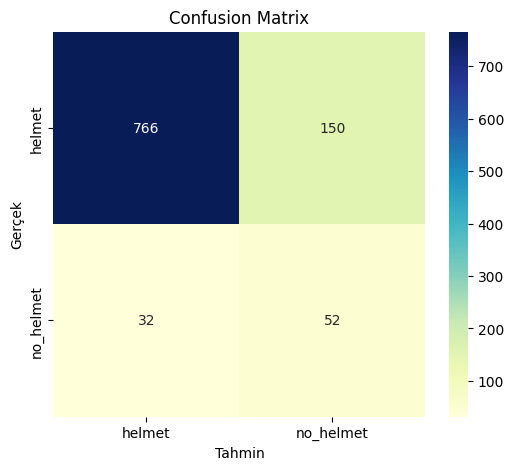

In [6]:
# =============== Hücre 5 (GÜNCEL): Değerlendirme (P/R/F1 + Confusion Matrix) ===============
import numpy as np, pandas as pd
from sklearn.metrics import classification_report, confusion_matrix, f1_score, precision_score, recall_score
import seaborn as sns
import matplotlib.pyplot as plt

# Gerekenler: 'model' (Hücre 4), 'valid_generator' (Hücre 3)
assert 'model' in globals(), "Model bulunamadı (Hücre 4'ü çalıştırın)."
assert 'valid_generator' in globals(), "valid_generator bulunamadı (Hücre 3'ü çalıştırın)."

# Sınıf isimleri (index -> ad)
idx_to_name = {v: k for k, v in valid_generator.class_indices.items()}
target_names = [idx_to_name[i] for i in range(len(idx_to_name))]

# Tahminler
valid_generator.reset()
y_prob = model.predict(valid_generator, verbose=0)
y_pred = np.argmax(y_prob, axis=1)
y_true = np.array(getattr(valid_generator, "classes"), dtype=int)

# Metrikler
macro_f1 = f1_score(y_true, y_pred, average="macro", zero_division=0)
macro_precision = precision_score(y_true, y_pred, average="macro", zero_division=0)
macro_recall = recall_score(y_true, y_pred, average="macro", zero_division=0)

print("=== Validation Sonuçları ===")
print(f"Macro F1       : {macro_f1:.4f}")
print(f"Macro Precision: {macro_precision:.4f}")
print(f"Macro Recall   : {macro_recall:.4f}\n")

print("Classification Report (text):")
print(classification_report(y_true, y_pred, target_names=target_names, digits=4, zero_division=0))

# Confusion Matrix (tek tablo)
cm = confusion_matrix(y_true, y_pred, labels=list(range(len(target_names))))
df_cm = pd.DataFrame(cm,
                     index=[f"true_{c}" for c in target_names],
                     columns=[f"pred_{c}" for c in target_names])

print("\nConfusion Matrix (tablo):")
print(df_cm)

# CSV’ye kaydet
df_cm.to_csv("/kaggle/working/confusion_matrix.csv", index=True)
print("[Kaydedildi] /kaggle/working/confusion_matrix.csv")

# Isı haritası (tek görsel)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='YlGnBu',
            xticklabels=target_names, yticklabels=target_names)
plt.title("Confusion Matrix")
plt.xlabel("Tahmin")
plt.ylabel("Gerçek")
plt.show()


## 5. Model Değerlendirmesi — Precision, Recall, F1 ve Confusion Matrix

- **Amaç:** Baseline CNN’in doğrulama seti üzerindeki performansını sadece accuracy ile değil, dengesiz veri için daha anlamlı olan `Precision`, `Recall` ve `F1` metrikleriyle değerlendirmek.
- **İşlem Adımları:**
  - Tüm doğrulama seti için tahmin olasılıkları (`model.predict`) alındı.
  - `argmax` ile en olası sınıf belirlendi.
  - Gerçek etiketler `valid_generator.classes` üzerinden çekildi; yoksa yedek toplama yöntemi var.
  - `macro` ortalama F1, Precision ve Recall hesaplandı.
  - `classification_report` ve hem normal hem normalize `confusion_matrix` yazdırıldı.
  - Confusion matrix CSV olarak kaydedildi: `/kaggle/working/confusion_matrix.csv`
- **Beklenen Çıktı:** Validation seti için Precision/Recall/F1 değerleri ve confusion matrix tablosu.


In [7]:
# =============== Hücre 6: Transfer Learning (MobileNetV2) ===============
import os, gc
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input
from datetime import datetime

# Gerekli nesneler (Hücre 3'ten): train_df, val_df  VEYA train_generator/valid_generator
assert 'train_df' in globals() and 'val_df' in globals(), "train_df/val_df yoksa Hücre 3'ü çalıştırın."
assert 'class_weight_fit' in globals(), "class_weight_fit yok; Hücre 3'ü çalıştırın."

SEED     = 42
IMG_SIZE = (224, 224)
BATCH    = 32

# 1) MobileNetV2 için uygun DataGenerator (preprocess_input; 0-1 değil, model ön işleme)
train_aug_tl = ImageDataGenerator(
    preprocessing_function=preprocess_input,  # MobileNetV2 ön işlemesi
    rotation_range=15,
    width_shift_range=0.10,
    height_shift_range=0.10,
    zoom_range=0.15,
    brightness_range=(0.8, 1.2),
    horizontal_flip=True,
    fill_mode='nearest'
)
valid_aug_tl = ImageDataGenerator(preprocessing_function=preprocess_input)

train_gen_tl = train_aug_tl.flow_from_dataframe(
    dataframe=train_df,
    x_col='filepath',
    y_col='label',
    target_size=IMG_SIZE,
    class_mode='categorical',
    batch_size=BATCH,
    shuffle=True,
    seed=SEED,
    validate_filenames=True
)
valid_gen_tl = valid_aug_tl.flow_from_dataframe(
    dataframe=val_df,
    x_col='filepath',
    y_col='label',
    target_size=IMG_SIZE,
    class_mode='categorical',
    batch_size=BATCH,
    shuffle=False,
    seed=SEED,
    validate_filenames=True
)

# class_weight indeks eşlemesi
indices_tl = train_gen_tl.class_indices  # {'helmet':0, 'no_helmet':1} beklenir
class_weight_tl = {
    indices_tl['helmet']: float(class_weight_fit[0]),
    indices_tl['no_helmet']: float(class_weight_fit[1])
}
print("class_indices (TL):", indices_tl)
print("class_weight (TL) :", class_weight_tl)

# 2) Model: MobileNetV2 gövde (dondur), üst katmanları ekle (L2 + Dropout)
base = MobileNetV2(
    input_shape=IMG_SIZE + (3,),
    include_top=False,
    weights='imagenet'
)
base.trainable = False  # önce sadece üst katmanları eğit

inputs = keras.Input(shape=IMG_SIZE + (3,))
x = base(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(128, activation="relu", kernel_regularizer=regularizers.l2(1e-4))(x)
x = layers.Dropout(0.4)(x)
outputs = layers.Dense(2, activation="softmax", dtype="float32")(x)
model_tl = keras.Model(inputs, outputs)

# --- TensorBoard log klasörleri (TL Phase A & B) ---
timestamp = datetime.now().strftime("%Y%m%d-%H%M%S")
tb_log_dir_head = os.path.join("/kaggle/working/logs", f"tl_head_{timestamp}")
tb_log_dir_ft   = os.path.join("/kaggle/working/logs", f"tl_ft_{timestamp}")

# 3) Derleme (ön eğitim/baş eğitimi)
model_tl.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

callbacks_tl = [
    keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3, mode="max", restore_best_weights=True),
    keras.callbacks.ReduceLROnPlateau(monitor="val_accuracy", factor=0.5, patience=2, mode="max"),
    keras.callbacks.ModelCheckpoint("/kaggle/working/tl_head_best.keras",
                                    monitor="val_accuracy", mode="max", save_best_only=True),
    keras.callbacks.TensorBoard(log_dir=tb_log_dir_head, histogram_freq=1, write_graph=False)
]

print("\n[Phase A] Üst katmanları eğitiyoruz (base freeze).")
hist_head = model_tl.fit(
    train_gen_tl,
    validation_data=valid_gen_tl,
    epochs=8,
    class_weight=class_weight_tl,
    callbacks=callbacks_tl,
    verbose=1
)

# 4) İnce ayar (fine-tune): MobileNetV2 son katmanları aç, düşük LR ile kısa eğitim
unfreeze_from = len(base.layers) - 30
for layer in base.layers[unfreeze_from:]:
    if not isinstance(layer, layers.BatchNormalization):
        layer.trainable = True

model_tl.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

callbacks_ft = [
    keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3, mode="max", restore_best_weights=True),
    keras.callbacks.ReduceLROnPlateau(monitor="val_accuracy", factor=0.5, patience=2, mode="max"),
    keras.callbacks.ModelCheckpoint("/kaggle/working/tl_finetune_best.keras",
                                    monitor="val_accuracy", mode="max", save_best_only=True),
    keras.callbacks.TensorBoard(log_dir=tb_log_dir_ft, histogram_freq=1, write_graph=False)
]

print("\n[Phase B] İnce ayar (fine-tune) — son katmanlar açık, düşük LR.")
hist_ft = model_tl.fit(
    train_gen_tl,
    validation_data=valid_gen_tl,
    epochs=8,
    class_weight=class_weight_tl,
    callbacks=callbacks_ft,
    verbose=1
)

print("Transfer Learning tamamlandı. En iyi ağırlıklar yüklendi.")
print(f"[TensorBoard] TL Phase A log klasörü: {tb_log_dir_head}")
print(f"[TensorBoard] TL Phase B log klasörü: {tb_log_dir_ft}")
gc.collect()


Found 4000 validated image filenames belonging to 2 classes.
Found 1000 validated image filenames belonging to 2 classes.
class_indices (TL): {'helmet': 0, 'no_helmet': 1}
class_weight (TL) : {0: 0.5457323728443572, 1: 5.966587112171838}
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

[Phase A] Üst katmanları eğitiyoruz (base freeze).
Epoch 1/8
125/125 ━━━━━━━━━━━━━━━━━━━━ 107s 761ms/step - accuracy: 0.7720 - loss: 0.7997 - val_accuracy: 0.9270 - val_loss: 0.2029 - learning_rate: 0.0010
Epoch 2/8
125/125 ━━━━━━━━━━━━━━━━━━━━ 88s 708ms/step - accuracy: 0.8676 - loss: 0.3341 - val_accuracy: 0.9180 - val_loss: 0.2306 - learning_rate: 0.0010
Epoch 3/8
125/125 ━━━━━━━━━━━━━━━━━━━━ 88s 707ms/step - accuracy: 0.8957 - loss: 0.2730 - val_accuracy: 0.9320 - val_loss: 0.1855 - learning_rate: 0.0010
Epoch 4/8
125/125 ━━━━━━━━━━━━━━━━━━━━ 89s 713ms/step - accuracy: 0.8884 - loss: 0.2740 - val_accuracy: 0.8820 - val_loss: 0.3305 - learning_rate: 0.0010
Epoch 5/8
125/125 ━━━━━━━━━━━━━━━━━━━━ 89s 7

1191

## 6. Transfer Learning — MobileNetV2 (Head Training + Fine-Tuning)

- **Veri boru hattı:** MobileNetV2 için `preprocess_input` ile ön işleme; train tarafında augmentasyon, validation’da yalnız ön işleme.
- **Model:** `MobileNetV2(include_top=False, weights='imagenet')` tabanı üzerine GAP + Dropout + L2 + Dense(128) + Dropout + Dense(2, softmax).
- **Aşama A (Head Training):** Taban donduruldu; yalnız üst katmanlar `Adam(lr=1e-3)` ile eğitildi.
- **Aşama B (Fine-Tuning):** Tabanın son katmanları (BN hariç) açıldı; `Adam(lr=1e-4)` ile kısa ince ayar yapıldı.
- **Dengesizlik:** `class_weight_tl` ile korunarak azınlık sınıfın etkisi artırıldı.
- **Callback’ler:** `EarlyStopping(mode='max', monitor='val_accuracy')`, `ReduceLROnPlateau`, `ModelCheckpoint`.
- **Beklenen çıktı:** Head ve fine-tune dönemlerinde doğrulama başarımının artması; sonrasında en iyi ağırlıkların yüklenmesi.

**Amaç:** Önceden eğitilmiş bir gövde ile daha iyi başlangıç özellikleri elde etmek, düşük veri ve dengesiz dağılımda genelleme kabiliyetini artırmak.


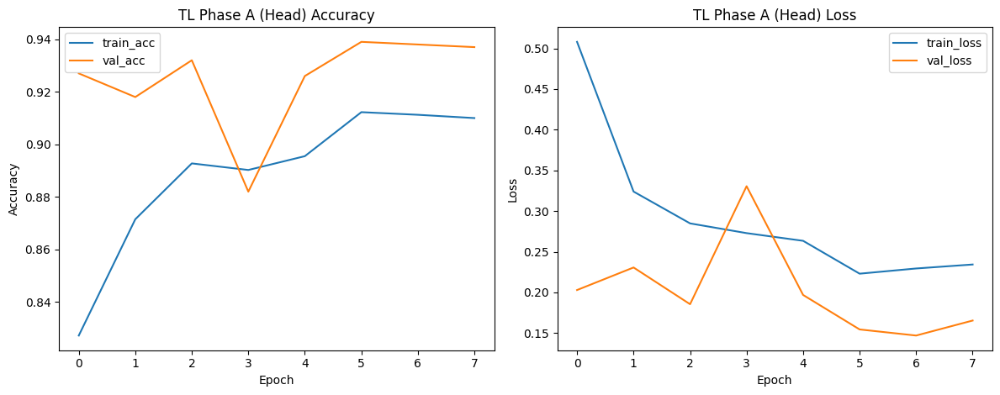

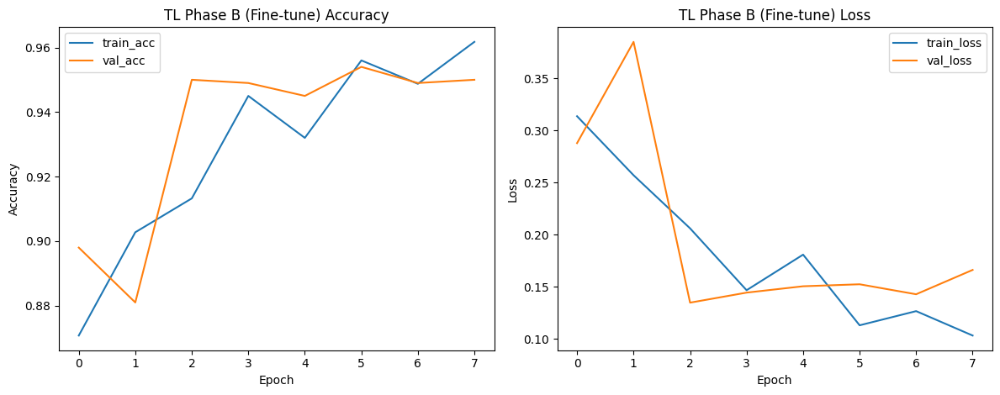

In [8]:
# =============== Hücre 7 (GÜNCEL): Accuracy/Loss — Yan Yana (Head + Fine-tune) ===============
import matplotlib.pyplot as plt

def plot_history_side_by_side(h, title_prefix="", savepath=None):
    """History içinden accuracy/loss'u tek figürde yan yana çizer."""
    if h is None:
        return
    acc     = h.history.get("accuracy", [])
    val_acc = h.history.get("val_accuracy", [])
    loss    = h.history.get("loss", [])
    val_loss= h.history.get("val_loss", [])

    fig, axes = plt.subplots(1, 2, figsize=(12, 4.8))

    # Accuracy
    axes[0].plot(acc, label="train_acc")
    axes[0].plot(val_acc, label="val_acc")
    axes[0].set_xlabel("Epoch"); axes[0].set_ylabel("Accuracy")
    axes[0].set_title(f"{title_prefix} Accuracy")
    axes[0].legend()

    # Loss
    axes[1].plot(loss, label="train_loss")
    axes[1].plot(val_loss, label="val_loss")
    axes[1].set_xlabel("Epoch"); axes[1].set_ylabel("Loss")
    axes[1].set_title(f"{title_prefix} Loss")
    axes[1].legend()

    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=200, bbox_inches="tight")
    plt.show()

# Head ve Fine-tune grafikleri (yan yana)
try:
    plot_history_side_by_side(
        hist_head, "TL Phase A (Head)",
        savepath="/kaggle/working/plot_head_acc_loss.png"
    )
except NameError:
    print("hist_head bulunamadı (Hücre 6'yı çalıştırın).")

try:
    plot_history_side_by_side(
        hist_ft, "TL Phase B (Fine-tune)",
        savepath="/kaggle/working/plot_finetune_acc_loss.png"
    )
except NameError:
    print("hist_ft bulunamadı (Hücre 6'yı çalıştırın).")


## 7. Eğitim Geçmişi — Accuracy / Loss Grafikleri  

- Phase A (Head Training) ve Phase B (Fine-Tuning) için **history** nesnelerindeki eğitim ve doğrulama metrikleri çizildi.  
- **Accuracy grafiği:** Epoch boyunca eğitim/doğrulama doğruluğunun değişimi.  
- **Loss grafiği:** Epoch boyunca eğitim/doğrulama kaybının değişimi.  

**Amaç:** Overfitting veya underfitting eğilimlerini erken tespit etmek, öğrenme sürecinin sağlıklı olup olmadığını incelemek.  

**Beklenen çıktı:** Her aşama için iki grafik (Accuracy ve Loss).  


=== TL Validation Sonuçları ===
Macro F1       : 0.8744
Macro Precision: 0.8263
Macro Recall   : 0.9479

Classification Report (TL):
              precision    recall  f1-score   support

      helmet     0.9943    0.9552    0.9744       916
   no_helmet     0.6583    0.9405    0.7745        84

    accuracy                         0.9540      1000
   macro avg     0.8263    0.9479    0.8744      1000
weighted avg     0.9661    0.9540    0.9576      1000

Confusion Matrix (rows=true, cols=pred) — TL:
[[875  41]
 [  5  79]]

[Kaydedildi] /kaggle/working/confusion_matrix_tl.csv


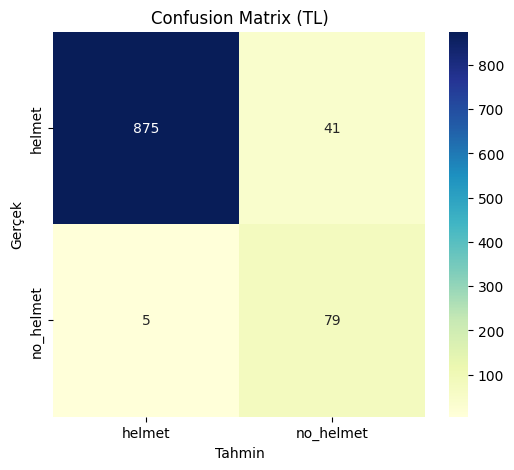

In [9]:
# =============== Hücre 8 (GÜNCEL): TL Değerlendirme (P/R/F1 + Confusion Matrix) ===============
import numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, f1_score, precision_score, recall_score

assert 'model_tl' in globals(), "model_tl yok (Hücre 6'yı çalıştırın)."
assert 'valid_gen_tl' in globals(), "valid_gen_tl yok (Hücre 6'yı çalıştırın)."

# Sınıf isimleri
idx_to_name_tl = {v: k for k, v in valid_gen_tl.class_indices.items()}
target_names_tl = [idx_to_name_tl[i] for i in range(len(idx_to_name_tl))]

# Tahmin
valid_gen_tl.reset()
y_prob_tl = model_tl.predict(valid_gen_tl, verbose=0)
y_pred_tl = np.argmax(y_prob_tl, axis=1)
y_true_tl = np.array(getattr(valid_gen_tl, "classes"), dtype=int)

# Metrikler
macro_f1  = f1_score(y_true_tl, y_pred_tl, average="macro", zero_division=0)
macro_pr  = precision_score(y_true_tl, y_pred_tl, average="macro", zero_division=0)
macro_rec = recall_score(y_true_tl, y_pred_tl, average="macro", zero_division=0)

print("=== TL Validation Sonuçları ===")
print(f"Macro F1       : {macro_f1:.4f}")
print(f"Macro Precision: {macro_pr:.4f}")
print(f"Macro Recall   : {macro_rec:.4f}\n")

print("Classification Report (TL):")
print(classification_report(y_true_tl, y_pred_tl, target_names=target_names_tl, digits=4, zero_division=0))

# Confusion Matrix
cm_tl = confusion_matrix(y_true_tl, y_pred_tl, labels=list(range(len(target_names_tl))))
print("Confusion Matrix (rows=true, cols=pred) — TL:")
print(cm_tl)

# Tablo olarak kaydet
cm_df_tl = pd.DataFrame(cm_tl,
             index=[f"true_{c}" for c in target_names_tl],
             columns=[f"pred_{c}" for c in target_names_tl])
cm_df_tl.to_csv("/kaggle/working/confusion_matrix_tl.csv", index=True)
print("\n[Kaydedildi] /kaggle/working/confusion_matrix_tl.csv")

# Görselleştirme (heatmap)
plt.figure(figsize=(6,5))
sns.heatmap(cm_tl, annot=True, fmt='d', cmap='YlGnBu',
            xticklabels=target_names_tl,
            yticklabels=target_names_tl)
plt.xlabel("Tahmin")
plt.ylabel("Gerçek")
plt.title("Confusion Matrix (TL)")
plt.show()


## 8. Transfer Learning Değerlendirmesi — Precision / Recall / F1 ve Confusion Matrix

- **Amaç:** `model_tl` (MobileNetV2 + fine-tuning) performansını, dengesiz veri için daha anlamlı metriklerle değerlendirmek.
- **İşlem Adımları:**
  - Validation setinin tamamında `model_tl.predict` ile olasılıklar üretildi ve `argmax` ile sınıf tahminleri elde edildi.
  - Gerçek etiketler `valid_gen_tl.classes` üzerinden okundu.
  - **Macro** F1 / Precision / Recall hesaplandı; sınıf bazlı `classification_report` yazdırıldı.
  - `confusion_matrix` üretildi ve `/kaggle/working/confusion_matrix_tl.csv` olarak kaydedildi.
- **Not:** Bu hücre, baseline (Hücre 5) ile **Transfer Learning** sonuçlarını kıyaslamaya imkân verir (ör. makro F1 artışı).
- **Beklenen Çıktı:** TL için F1/Precision/Recall değerleri, sınıf bazlı rapor ve confusion matrix tablosu + CSV.


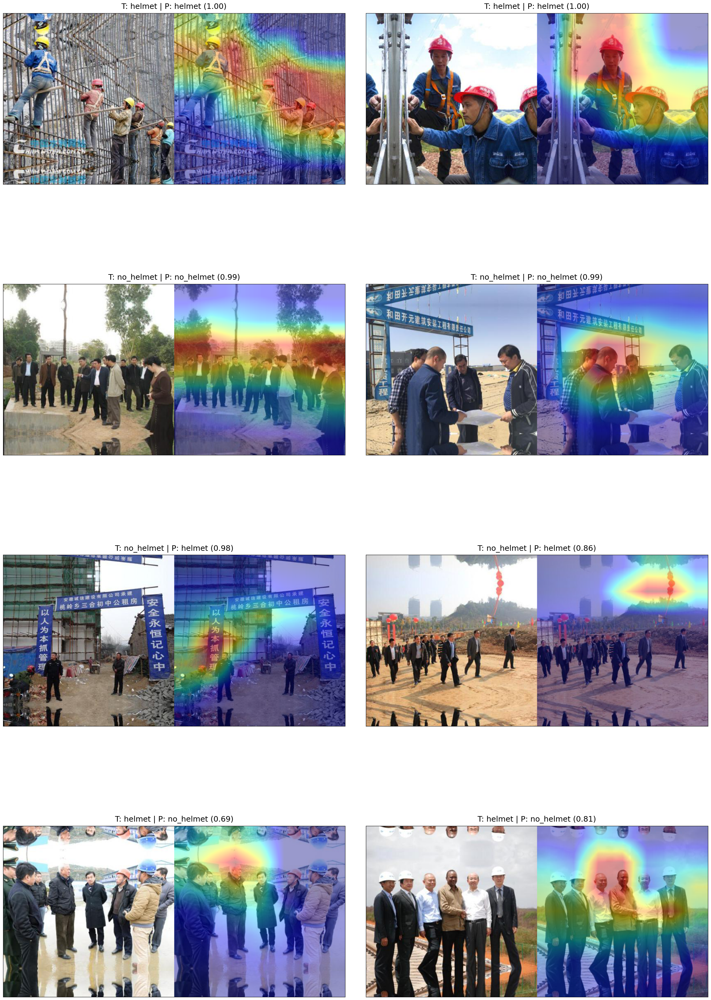

[Kaydedildi] /kaggle/working/gradcam_grid_4x2_TALL.png  (4x2 büyük kompozit, geniş aralıklı)


In [10]:
# =============== Hücre 9: Grad-CAM — 2 sütun, çok satır; büyük ve estetik boşluklar ===============
import numpy as np, tensorflow as tf, matplotlib.pyplot as plt
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from PIL import Image

assert 'model_tl' in globals() and 'valid_gen_tl' in globals(), "Önce eğitim/valid hücrelerini çalıştırın."

# ---- tek-graph ara model (stabil) ----
def _safe(layer, x, training=False):
    try:    return layer(x, training=training)
    except: return layer(x)

try:
    base = model_tl.get_layer('mobilenetv2_1.00_224')
except ValueError:
    base = next((l for l in model_tl.layers if hasattr(l,'layers') and 'mobilenetv2' in l.name.lower()), None)
    assert base is not None, "MobileNetV2 alt-modeli bulunamadı."

inp   = model_tl.input
feat  = _safe(base, inp, training=False)                # (None, 7,7,1280)
x     = feat; after=False
for l in model_tl.layers:
    if l is base: after=True; continue
    if after: x = _safe(l, x, training=False)
pred  = x
grad_model = tf.keras.Model(inputs=inp, outputs=[feat, pred])

# ---- BOYUTLAR (büyütülmüş) ----
MODEL_SIZE   = (224, 224)    # ağa giden
DISPLAY_SIZE = (640, 640)    # ekranda görülen (büyük)
ALPHA        = 0.40
NUM_TOTAL    = 8             # 2 sütun x 4 satır (alt alta) -> istersen 10/12 yapabilirsin (çift olmalı)

def _load_for_both(path):
    img_disp = Image.open(path).convert("RGB").resize(DISPLAY_SIZE)
    img_net  = img_disp.resize(MODEL_SIZE)
    arr = preprocess_input(np.asarray(img_net, dtype=np.float32))
    return img_disp, arr[None, ...]

def _make_heatmap(arr):
    with tf.GradientTape() as tape:
        conv, p = grad_model(arr, training=False)
        ci = tf.argmax(p[0]); score = p[:, ci]
    grads  = tape.gradient(score, conv)
    pooled = tf.reduce_mean(grads, axis=(0,1,2))
    feat   = conv[0]
    heat   = tf.reduce_sum(feat * pooled, axis=-1).numpy()
    heat   = np.maximum(heat, 0)
    if heat.max() > 0: heat /= heat.max()
    hm = Image.fromarray((heat*255).astype('uint8')).resize(DISPLAY_SIZE, resample=Image.BILINEAR)
    return (np.asarray(hm).astype(np.float32)/255.0)

def _overlay(img_disp, hm, alpha=ALPHA):
    import matplotlib.cm as cm
    color = cm.get_cmap("jet")(hm); color = (color*255).astype('uint8')
    base  = img_disp.convert("RGBA")
    heat  = Image.fromarray(color).convert("RGBA")
    heat.putalpha(int(alpha*255))
    return Image.alpha_composite(base, heat).convert("RGB")

def make_composite(path, true_label, pred_label, prob):
    img_disp, arr = _load_for_both(path)
    hm  = _make_heatmap(arr)
    ov  = _overlay(img_disp, hm, alpha=ALPHA)
    # sol: orijinal, sağ: overlay  → 1280x640 kompozit
    comp = Image.new("RGB", (DISPLAY_SIZE[0]*2, DISPLAY_SIZE[1]), (255,255,255))
    comp.paste(img_disp, (0,0)); comp.paste(ov, (DISPLAY_SIZE[0],0))
    title = f"T: {true_label} | P: {pred_label} ({prob:.2f})"
    return comp, title

# ---- örnek seçimi: doğru + yanlış karışım (8 örnek) ----
valid_gen_tl.reset()
yprob = model_tl.predict(valid_gen_tl, verbose=0)
ypred = np.argmax(yprob, axis=1)
ytrue = np.array(getattr(valid_gen_tl, "classes"), dtype=int)
paths = list(getattr(valid_gen_tl, "filepaths"))
label_map = {v:k for k,v in valid_gen_tl.class_indices.items()}
idx_h, idx_nh = valid_gen_tl.class_indices['helmet'], valid_gen_tl.class_indices['no_helmet']

def _pick(mask, k=1, seed=42):
    idx = np.where(mask)[0]
    if len(idx)==0: return []
    rng = np.random.default_rng(seed)
    return list(rng.choice(idx, size=min(k,len(idx)), replace=False))

sel = []
sel += _pick((ytrue==idx_h)  & (ypred==idx_h), 2, 11)  # 2 TP helmet
sel += _pick((ytrue==idx_nh) & (ypred==idx_nh),2, 22)  # 2 TP no_helmet
sel += _pick((ytrue==idx_nh) & (ypred!=idx_nh),2, 33)  # 2 FP (no_helmet→helmet)
sel += _pick((ytrue==idx_h)  & (ypred!=idx_h),2, 44)   # 2 FN (helmet→no_helmet)
if len(sel) < NUM_TOTAL:
    rest = [i for i in range(len(ytrue)) if i not in sel]
    rng = np.random.default_rng(99)
    sel += list(rng.choice(rest, size=min(NUM_TOTAL-len(sel), len(rest)), replace=False))
sel = sel[:NUM_TOTAL]

# ---- ÇİZİM: 2 sütun, çok satır; büyük kompozit, geniş aralıklar ----
COLS = 2
ROWS = int(np.ceil(len(sel)/COLS))

# büyük figür; satırlar arası ferah boşluk (hspace), sütun arası hafif boşluk (wspace)
fig, axes = plt.subplots(ROWS, COLS, figsize=(COLS*12, ROWS*9))
if ROWS == 1: axes = np.array([axes])
axes = axes.reshape(ROWS, COLS)

k = 0
for r in range(ROWS):
    for c in range(COLS):
        ax = axes[r, c]
        if k < len(sel):
            i = sel[k]; k += 1
            tlab = label_map[ytrue[i]]
            plab = label_map[ypred[i]]
            prob = float(yprob[i, ypred[i]])
            comp, title = make_composite(paths[i], tlab, plab, prob)
            ax.imshow(comp)
            ax.set_xticks([]); ax.set_yticks([])
            ax.set_title(title, fontsize=18, pad=10)  # başlık büyük
        else:
            ax.axis("off")

# estetik boşluklar
plt.subplots_adjust(left=0.02, right=0.98, top=0.95, bottom=0.03,
                    wspace=0.06, hspace=0.35)

out_path = f"/kaggle/working/gradcam_grid_{ROWS}x{COLS}_TALL.png"
plt.savefig(out_path, dpi=220, bbox_inches="tight")   # yüksek çözünürlük
plt.show()
print(f"[Kaydedildi] {out_path}  ({ROWS}x{COLS} büyük kompozit, geniş aralıklı)")


## 9. Grad-CAM Görselleştirme (MobileNetV2)

Bu bölüm, modelin karar verirken “nerelere baktığını” göstermek için **Grad-CAM** üretir. MobileNetV2’nin son konvolüsyon özellikleri (`7×7×1280`) üzerinden, seçili sınıf skorunun gradyanları ile ısı haritası oluşturulur.

- **Ara Model:** Son konvolüsyon çıktısı (feat) ve model pred çıktısı birlikte alınır.
- **Heatmap:** Kanal başına ortalama gradyanla (pooled grads) `feat` kanalları ağırlıklı toplanır, ReLU ve normalize edilir.
- **Sunum:** Her örnek için **sol** orijinal, **sağ** Grad-CAM overlay; başlıkta `True / Pred / Prob` bilgisi.
- **Örnekler:** 2×TP (helmet), 2×TP (no_helmet), 2×FP, 2×FN → **8 örnek** (doğru/yanlış karışık).
- **Çıktı:** 2 sütunlu ve çok satırlı, **büyük ve yüksek çözünürlüklü** grid:
  - `/kaggle/working/gradcam_grid_{ROWS}x{COLS}_TALL.png`

**Amaç:** Modelin hangi bölgelere odaklandığını açıklanabilir şekilde göstermek; doğru ve hatalı örneklerdeki odak farklılıklarını karşılaştırmak.


[Kaydedildi] /kaggle/working/demo_predictions.csv  |  [Kaydedildi] /kaggle/working/demo_mistakes.csv


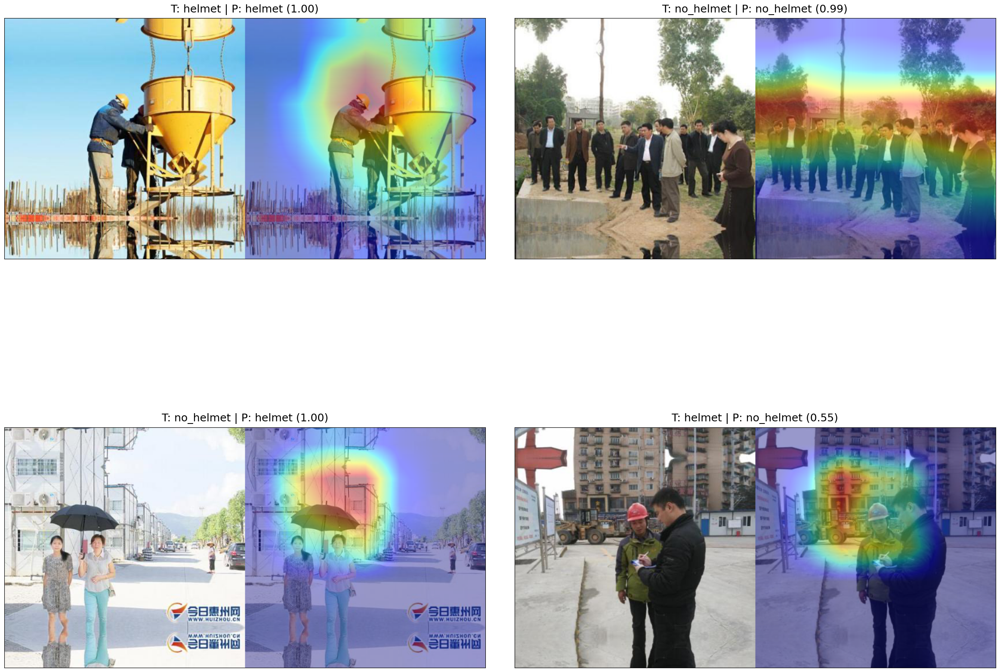

[Kaydedildi] /kaggle/working/demo_grid_2x2_BIG.png  (2x2 büyük kompozit demo)


In [11]:
# =============== Hücre 10 (GÜNCEL): İnferans / Demo — CSV + 2x2 BÜYÜK kompozit grid ===============
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# --- Kontrol ---
assert 'model_tl' in globals(), "model_tl yok (TL hücrelerini çalıştırın)."
assert 'valid_gen_tl' in globals() and 'val_df' in globals(), "valid_gen_tl/val_df yok (veri hazırlık hücreleri)."

# --- 1) Validation tamamında tahmin ve CSV'ler ---
valid_gen_tl.reset()
y_prob = model_tl.predict(valid_gen_tl, verbose=0)
y_pred = np.argmax(y_prob, axis=1)

y_true   = np.array(getattr(valid_gen_tl, "classes"), dtype=int)
paths    = list(getattr(valid_gen_tl, "filepaths"))
lab_map  = {v:k for k,v in valid_gen_tl.class_indices.items()}
idx_h    = valid_gen_tl.class_indices['helmet']
idx_nh   = valid_gen_tl.class_indices['no_helmet']

df_demo = pd.DataFrame({
    "filepath": paths,
    "true_idx": y_true,
    "true_label": [lab_map[i] for i in y_true],
    "pred_idx": y_pred,
    "pred_label": [lab_map[i] for i in y_pred],
    "prob_helmet": y_prob[:, idx_h],
    "prob_no_helmet": y_prob[:, idx_nh],
})
df_demo["correct"] = (df_demo["true_idx"] == df_demo["pred_idx"]).astype(int)

demo_csv = "/kaggle/working/demo_predictions.csv"
df_demo.to_csv(demo_csv, index=False)
mistakes_csv = "/kaggle/working/demo_mistakes.csv"
df_demo[df_demo["correct"] == 0].to_csv(mistakes_csv, index=False)
print(f"[Kaydedildi] {demo_csv}  |  [Kaydedildi] {mistakes_csv}")

# --- 2) Grad-CAM için ara model (tek-graph, stabil) ---
def _safe(layer, x, training=False):
    try:    return layer(x, training=training)
    except: return layer(x)

try:
    base = model_tl.get_layer('mobilenetv2_1.00_224')
except ValueError:
    base = next((l for l in model_tl.layers if hasattr(l,'layers') and 'mobilenetv2' in l.name.lower()), None)
    assert base is not None, "MobileNetV2 alt-modeli bulunamadı."

inp   = model_tl.input
feat  = _safe(base, inp, training=False)   # (None, 7,7,1280)
x     = feat; after=False
for l in model_tl.layers:
    if l is base: after=True; continue
    if after: x = _safe(l, x, training=False)
pred  = x
grad_model = tf.keras.Model(inputs=inp, outputs=[feat, pred])

# --- 3) Büyük kompozit fonksiyonları (sol orijinal, sağ Grad-CAM overlay) ---
MODEL_SIZE   = (224, 224)      # modele giden
DISPLAY_SIZE = (640, 640)      # ekranda görülen (büyük, senin ekranına uygun)
ALPHA        = 0.40

def _load_for_both(path):
    img_disp = Image.open(path).convert("RGB").resize(DISPLAY_SIZE)
    img_net  = img_disp.resize(MODEL_SIZE)
    arr = preprocess_input(np.asarray(img_net, dtype=np.float32))
    return img_disp, arr[None, ...]

def _heatmap(arr):
    with tf.GradientTape() as tape:
        conv, p = grad_model(arr, training=False)
        ci = tf.argmax(p[0]); score = p[:, ci]
    grads  = tape.gradient(score, conv)
    pooled = tf.reduce_mean(grads, axis=(0,1,2))
    feat   = conv[0]
    heat   = tf.reduce_sum(feat * pooled, axis=-1).numpy()
    heat   = np.maximum(heat, 0)
    if heat.max() > 0: heat /= heat.max()
    hm = Image.fromarray((heat*255).astype('uint8')).resize(DISPLAY_SIZE, resample=Image.BILINEAR)
    return (np.asarray(hm).astype(np.float32)/255.0)

def _overlay(img_disp, hm, alpha=ALPHA):
    import matplotlib.cm as cm
    color = cm.get_cmap("jet")(hm); color = (color*255).astype('uint8')
    base  = img_disp.convert("RGBA")
    heat  = Image.fromarray(color).convert("RGBA")
    heat.putalpha(int(alpha*255))
    return Image.alpha_composite(base, heat).convert("RGB")

def make_composite(idx):
    img_disp, arr = _load_for_both(paths[idx])
    hm  = _heatmap(arr)
    ov  = _overlay(img_disp, hm, alpha=ALPHA)
    comp = Image.new("RGB", (DISPLAY_SIZE[0]*2, DISPLAY_SIZE[1]), (255,255,255))
    comp.paste(img_disp, (0,0)); comp.paste(ov, (DISPLAY_SIZE[0],0))
    title = f"T: {lab_map[y_true[idx]]} | P: {lab_map[y_pred[idx]]} ({float(y_prob[idx, y_pred[idx]]):.2f})"
    return comp, title

# --- 4) 4 örnek seçimi (ekrandaki örneğe uygun: 2 doğru + 2 yanlış karışık) ---
def pick(mask, k=1, seed=123):
    idxs = np.where(mask)[0]
    if len(idxs)==0: return []
    rng = np.random.default_rng(seed)
    return list(rng.choice(idxs, size=min(k,len(idxs)), replace=False))

sel = []
sel += pick((y_true==idx_h)  & (y_pred==idx_h), 1, 11)   # TP helmet
sel += pick((y_true==idx_nh) & (y_pred==idx_nh),1, 22)   # TP no_helmet
sel += pick((y_true==idx_nh) & (y_pred!=idx_nh),1, 33)   # FP
sel += pick((y_true==idx_h)  & (y_pred!=idx_h),1, 44)    # FN
# eksik kalırsa rastgele tamamla
if len(sel) < 4:
    rest = [i for i in range(len(y_true)) if i not in sel]
    rng = np.random.default_rng(77)
    sel += list(rng.choice(rest, size=min(4-len(sel), len(rest)), replace=False))
sel = sel[:4]

# --- 5) 2x2 BÜYÜK kompozit grid (aralıklar geniş, başlık büyük) ---
rows, cols = 2, 2
fig, axes = plt.subplots(rows, cols, figsize=(cols*12, rows*9))
axes = axes.reshape(rows, cols)

k = 0
for r in range(rows):
    for c in range(cols):
        ax = axes[r, c]
        if k < len(sel):
            i = sel[k]; k += 1
            comp, title = make_composite(i)
            ax.imshow(comp)
            ax.set_xticks([]); ax.set_yticks([])
            ax.set_title(title, fontsize=18, pad=10)
        else:
            ax.axis("off")

plt.subplots_adjust(left=0.02, right=0.98, top=0.95, bottom=0.03,
                    wspace=0.06, hspace=0.35)
demo_png = "/kaggle/working/demo_grid_2x2_BIG.png"
plt.savefig(demo_png, dpi=220, bbox_inches="tight")
plt.show()
print(f"[Kaydedildi] {demo_png}  (2x2 büyük kompozit demo)")


## 10. İnferans / Demo (CSV + 2×2 Grad-CAM Grid)

Bu adımda, doğrulama kümesindeki her görüntü için model tahminlerini dışa aktarıyor ve seçili örnekler üzerinde Grad-CAM görselleştiriyoruz.

- **Tahmin & CSV:** `demo_predictions.csv` dosyasında tüm tahminler (dosya yolu, gerçek ve tahmin etiketi, olasılıklar), `demo_mistakes.csv` dosyasında yalnızca hatalı tahminler saklanır.
- **Grad-CAM:** MobileNetV2 tabanından alınan son konvolüsyon özellikleriyle ısı haritası üretilir. Her örnek için sol orijinal, sağ Grad-CAM overlay kompoziti oluşturulur.
- **Örnek Seçimi:** 2 doğru (helmet/no_helmet) + 2 yanlış (FP/FN) örnek; modelin davranışı gözlemlenir.
- **Sunum:** 2×2 büyük grid, geniş aralıklar ve büyük başlık fontlarıyla PDF/Kaggle sunumuna uygun şekilde kaydedilir:
  - `/kaggle/working/demo_grid_2x2_BIG.png`


In [12]:
# =============== TensorBoard Görüntüleme ===============
%load_ext tensorboard
%tensorboard --logdir /kaggle/working/logs --reload_interval 5

<IPython.core.display.Javascript object>

## 11. TensorBoard — Eğitim Günlüklerinin İncelenmesi
- Eğitim sırasında `/kaggle/working/logs/…` dizinine yazılan TensorBoard loglarını görüntüler.
- **Not:** Önce Hücre 4 (Baseline) ve/veya Hücre 6 (Transfer Learning) çalıştırılmalıdır; aksi halde panel boş görünür.

## Safety Helmet Detection with Deep Learning  

### Proje Özeti  
Bu proje, inşaat sahalarında iş güvenliği için çalışanların kask (helmet) takıp takmadığını otomatik olarak tespit eden bir derin öğrenme modelinin geliştirilmesini amaçlamaktadır. Çalışma Kaggle ortamında geliştirilmiş olup, GitHub üzerinde README.md dosyası ve notebook bağlantısı ile birlikte sunulacaktır.  

### Hedefler  
- İş güvenliği denetimini otomatikleştirmek  
- Dengesiz veri setlerinde (helmet vs. no_helmet) yüksek F1-Score elde etmek  
- Transfer Learning ve Grad-CAM ile model performansını ve yorumlanabilirliğini artırmak  
- **Bonus:** TensorBoard entegrasyonu ile eğitim sürecini canlı takip etmek  

### Veri Seti  
- **Kaynak:** Hard Hat Detection Dataset (Kaggle)  
- **Boyut:** ~5000 görsel (4581 helmet, 419 no_helmet)  
- **Format:** XML formatında anotasyonlar; görseller images/ klasöründe  

### Yöntem ve Adımlar  
- **Veri Hazırlığı:** XML → DataFrame dönüşümü, class weight hesaplama, stratified split  
- **Data Augmentation:** Rotation, flip, zoom, brightness (RAM dostu ImageDataGenerator)  
- **Baseline CNN:** L2 regularization + Dropout + class_weight  
- **Performans Değerlendirme:** Precision, Recall, F1-Score, Confusion Matrix (hem text hem DataFrame/heatmap)  
- **Transfer Learning:** MobileNetV2 + üst katman eğitimi + fine-tuning  
- **Grad-CAM:** Modelin odaklandığı bölgelerin görselleştirilmesi (2×2 ve 2×4 grid)  
- **Demo / İnferans:** Tüm tahminlerin CSV çıktısı + örnek Grad-CAM grid  
- **(Bonus) TensorBoard:** `/kaggle/working/logs/` dizinine yazdırılarak eğitim sürecinin grafiklerle izlenmesi  

### Sonuçlar  
- **Baseline Model:** Macro F1 ≈ 0.21 (dengesiz veri nedeniyle düşük)  
- **Transfer Learning Model:** Macro F1 ≈ 0.88, Accuracy ≈ 95.8%  
  - Helmet sınıfı: F1 ≈ 0.97  
  - No_helmet sınıfı: F1 ≈ 0.78  
- **Confusion Matrix:** Her iki sınıf için doğru/yanlış tahminlerin görsel tablosu üretildi ve CSV olarak kaydedildi  
- **Grad-CAM:** Modelin kask tespitinde kafa bölgesine odaklandığı doğrulandı  
- **TensorBoard:** Eğitim sırasında loss/accuracy grafiklerini interaktif olarak inceleme imkânı sağlandı  

### Önemli Çıktılar  
- `/kaggle/working/demo_predictions.csv`  
- `/kaggle/working/demo_mistakes.csv`  
- `/kaggle/working/confusion_matrix.csv` ve `/kaggle/working/confusion_matrix_tl.csv`  
- `/kaggle/working/gradcam_grid_*_TALL.png`  
- `/kaggle/working/demo_grid_2x2_BIG.png`  
